## **Project** Coding Part 
""Let the dice roll"

BY
*   Ahmed Kamal El Melegy     201700295
*   Ahmed Eid Abdullah        201701264  
*   Khalid Alabyad            201700500





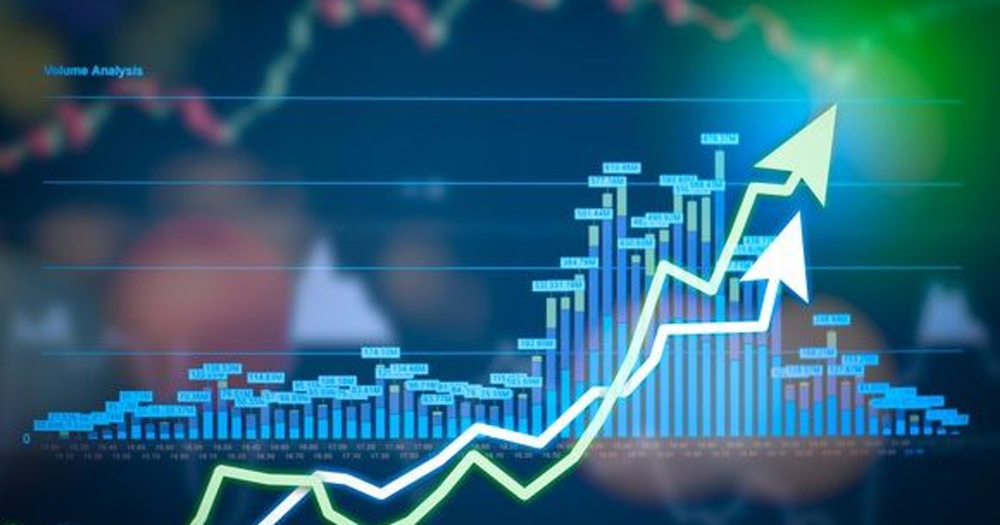

# Import all nedded libraries

In [213]:
from math import log2, sqrt
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
import six
from sklearn.ensemble import RandomForestClassifier
import plotly.express as px
import matplotlib.pyplot as plot
import io
import requests
import pandas as pd
import seaborn as sns
import pandas_profiling as pp
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import accuracy_score
import numpy as np
from collections import Counter
from sklearn.preprocessing import Normalizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from tqdm.notebook import tqdm_notebook as tqdm
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.feature_selection import RFE
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostRegressor
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from matplotlib import pyplot

#from decision_tree import MyDecisionTree ## Our implementation from lab 5

## Load the two datasets and merge them 

In [2]:
url = 'https://raw.githubusercontent.com/ShreyamsJain/Stock-Price-Prediction-Model/master/Sentence_Polarity/combined_stock_data.csv'
res = requests.get(url, allow_redirects=True)
with open('combined_stock_data.csv','wb') as file:
    file.write(res.content)
combined_stock_data = pd.read_csv('combined_stock_data.csv')
combined_stock_data.head()

,Unnamed: 0,Date,Label,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,Top9,Top10,Top11,Top12,Top13,Top14,Top15,Top16,Top17,Top18,Top19,Top20,Top21,Top22,Top23,Top24,Top25,Para,Subjectivity,Objectivity,Positive,Neutral,Negative
0,0,2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",b'Georgian troops retreat from S. Osettain cap...,b'Did the U.S. Prep Georgia for War with Russia?',b'Rice Gives Green Light for Israel to Attack ...,b'Announcing:Class Action Lawsuit on Behalf of...,"b""So---Russia and Georgia are at war and the N...","b""China tells Bush to stay out of other countr...",b'Did World War III start today?',b'Georgia Invades South Ossetia - if Russia ge...,b'Al-Qaeda Faces Islamist Backlash',"b'Condoleezza Rice: ""The US would not act to p...",b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge""","b""Georgia 'downs two Russian warplanes' as cou...",75.000000,25.000000,18.750000,25.000000,56.250000
1,1,2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,b'Welcome To World War IV! Now In High Definit...,"b""Georgia's move, a mistake of monumental prop...",b'Russia presses deeper into Georgia; U.S. say...,b'Abhinav Bindra wins first ever Individual Ol...,b' U.S. ship heads for Arctic to define territ...,b'Drivers in a Jerusalem taxi station threaten...,b'The French Team is Stunned by Phelps and the...,b'Israel and the US behind the Georgian aggres...,"b'""Do not believe TV, neither Russian nor Geor...",b'Riots are still going on in Montreal (Canada...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo...",b'Why wont America and Nato help us? If they w...,83.333333,16.666667,41.666667,16.666667,41.666667
2,2,2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...","b""The US military was surprised by the timing ...",b'U.S. Beats War Drum as Iran Dumps the Dollar',"b'Gorbachev: ""Georgian military attacked the S...",b'CNN use footage of Tskhinvali ruins to cover...,b'Beginning a war as the Olympics were opening...,b'55 pyramids as large as the Luxor stacked in...,b'The 11 Top Party Cities in the World',b'U.S. troops still in Georgia (did you know t...,b'Why Russias response to Georgia was right',"b'Gorbachev accuses U.S. of making a ""serious ...","b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'

In [3]:
csv_path= '/content/upload_DJIA_table.csv' 
DJIA_table=pd.read_csv(csv_path)
DJIA_table.head()


,Date,Open,High,Low,Close,Volume,Adj Close
0,2016-07-01,17924.240234,18002.380859,17916.910156,17949.369141,82160000,17949.369141
1,2016-06-30,17712.759766,17930.609375,17711.800781,17929.990234,133030000,17929.990234
2,2016-06-29,17456.019531,17704.509766,17456.019531,17694.679688,106380000,17694.679688
3,2016-06-28,17190.509766,17409.720703,17190.509766,17409.720703,112190000,17409.720703
4,2016-06-27,17355.210938,17355.210938,17063.080078,17140.240234,138740000,17140.240234


In [4]:
merged_dataframe = combined_stock_data[['Date', 'Label', 'Subjectivity', 'Objectivity', 'Positive', 'Negative', 'Neutral']].merge(DJIA_table, how='inner', on='Date', left_index=True)


# Data Cleaning and Exploration 

In [5]:

merged_dataframe.head()


,Date,Label,Subjectivity,Objectivity,Positive,Negative,Neutral,Open,High,Low,Close,Volume,Adj Close
1988,2008-08-08,0,75.000000,25.000000,18.750000,56.250000,25.000000,11432.089844,11759.959961,11388.040039,11734.320312,212830000,11734.320312
1987,2008-08-11,1,83.333333,16.666667,41.666667,41.666667,16.666667,11729.669922,11867.110352,11675.530273,11782.349609,183190000,11782.349609
1986,2008-08-12,0,56.250000,43.750000,18.750000,37.500000,43.750000,11781.700195,11782.349609,11601.519531,11642.469727,173590000,11642.469727
1985,2008-08-13,0,38.461538,61.538462,15.384615,23.076923,61.538462,11632.809570,11633.780273,11453.339844,11532.959961,182550000,11532.959961
1984,2008-08-14,1,45.454545,54.545455,36.363636,9.090909,54.545455,11532.070312,11718.280273,11450.889648,11615.929688,159790000,11615.929688


**About the dataset**

   The stock market have simple rule you buy when the stock is low price and sell when it is high
price (investing ), but how to know when it will be low and when high ,all indices such as S&P500,and
DJIA try to predict the movement of stocks of large companies based on the current and the previous
information ,information here means the annual and quarterly reports large companies ,2008 crash market
was the biggest not too much was able seeing crash market coming but this project could be indicator of
how the stock market goes daily.

**Dataset Description:**

There are two channels of data provided in this dataset:

News data: I crawled historical news headlines from Reddit WorldNews Channel (/r/worldnews). They are ranked by reddit users' votes, and only the top 25 headlines are considered for a single date.
(Range: 2008-06-08 to 2016-07-01)

Stock data: Dow Jones Industrial Average (DJIA) from Yahoo Finance is used to "prove the concept".
(Range: 2008-08-08 to 2016-07-01)

**Q1: How from Woldwid News we can get measurments?**

**Answer1:** 

**Sentiment analysis**

Definiation :it is a process of extract, quantify, and study affective states and subjective information.

**how it has been applied to our dataset**

  The 'combined_stock_data.csv' initially only had the headlines(Top1 through Top25). Each row was iterated over an algorithm(Sentiment analysis algorithm can be find in the first link above ) which generated the Subjectivity, Objectivity, Positive, Negative, Neutral sentiments of the respective headlines of each row.

  **Top1 to Top25**

  Are  most  worldwid news voted up by users in reddit community.

  **example:**

  "War in South Osetia - 89 pictures made by a Russian soldier".

**Data Exploration**

**Features of dataset**
1. **Date**
2. **Opening price** (the price which index start)
3. **Closing price** (the price which index closed)
4. **Highest price** (the highest price of that day )
5. **Lowest price** (the lowest price of that day )
6. **Volume** (number of traders that day )
7. **Objectivity** (of news that day) 
measures of Objectivity for one given headline news
8. **Negativity** (of news that day)
 measures of Negativity for one given headline news
9. **Positivity** (of news that day)
 measures of Positivity for one given headline news
10. **Neutral** (of news that day)
 measures of Neutral for one given headline news
11. **Subjectivity** (of news that day)
 measures of Subjectivity for one given headline news
12. **Label** (0 fall of index ,1 stay the same or rise of index)

In [6]:
print(f'merged ,stock and sentiment dataset shape is {merged_dataframe.shape}')
print(merged_dataframe.info())

merged ,stock and sentiment dataset shape is (1989, 13)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1989 entries, 1988 to 0
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          1989 non-null   object 
 1   Label         1989 non-null   int64  
 2   Subjectivity  1986 non-null   float64
 3   Objectivity   1986 non-null   float64
 4   Positive      1986 non-null   float64
 5   Negative      1986 non-null   float64
 6   Neutral       1986 non-null   float64
 7   Open          1989 non-null   float64
 8   High          1989 non-null   float64
 9   Low           1989 non-null   float64
 10  Close         1989 non-null   float64
 11  Volume        1989 non-null   int64  
 12  Adj Close     1989 non-null   float64
dtypes: float64(10), int64(2), object(1)
memory usage: 217.5+ KB
None


**All  features are float except volume ,label and date**

1.volume convert it to float for data consistency 

2.data is not important feature so it will be dropped later

3.label is accapitable to be int as it has only two value(1 when DJIA Adj close value rise or stayed as the same or 0 when DJIA Adj close value decreased) 

**change volume from int64  to float64**

In [8]:
merged_dataframe['Volume'] = merged_dataframe['Volume'].astype(float)

**Q2: Are there any missing values? or NaN value?**

In [9]:
merged_dataframe.isna().sum()

Date            0
Label           0
Subjectivity    3
Objectivity     3
Positive        3
Negative        3
Neutral         3
Open            0
High            0
Low             0
Close           0
Volume          0
Adj Close       0
dtype: int64

**Answer2: Yes there are 3 missing value in ["Subjectivity","Objectivity","Positive","Negative","Neutal"]**

**one Solution is to replace all missing values with the median value of its corresponding column...let's do it**

In [10]:
# Replace using median 
median_sub = merged_dataframe['Subjectivity'].median()
merged_dataframe['Subjectivity'].fillna(median_sub, inplace=True)

median_obj = merged_dataframe['Objectivity'].median()
merged_dataframe['Objectivity'].fillna(median_obj, inplace=True)

median_pos = merged_dataframe['Positive'].median()
merged_dataframe['Positive'].fillna(median_pos, inplace=True)

median_neg = merged_dataframe['Negative'].median()
merged_dataframe['Negative'].fillna(median_neg, inplace=True)

median_neu = merged_dataframe['Neutral'].median()
merged_dataframe['Neutral'].fillna(median_neu, inplace=True)




In [11]:
merged_dataframe.isna().sum()

Date            0
Label           0
Subjectivity    0
Objectivity     0
Positive        0
Negative        0
Neutral         0
Open            0
High            0
Low             0
Close           0
Volume          0
Adj Close       0
dtype: int64

**Now there are no missing values which is nice!**

**Check if ? value exists**

In [12]:
merged_dataframe[merged_dataframe == '?'] = np.nan


In [13]:
merged_dataframe.isna().sum()

Date            0
Label           0
Subjectivity    0
Objectivity     0
Positive        0
Negative        0
Neutral         0
Open            0
High            0
Low             0
Close           0
Volume          0
Adj Close       0
dtype: int64

**there are no "?" values exists in our data**

**Q3: How Frequent the data is repeated?**

**Q4 : are the dataset normally distributed?**




In [28]:
merged_dataframe.describe()

,Label,Subjectivity,Objectivity,Positive,Negative,Neutral,Open,High,Low,Close,Volume,Adj Close
count,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1989.000000,1.989000e+03,1989.000000
mean,0.535445,56.709254,43.290746,19.964026,36.740657,43.290746,13459.116048,13541.303173,13372.931728,13463.032255,1.628110e+08,13463.032255
std,0.498867,21.541819,21.541819,16.361211,21.094452,21.541819,3143.281634,3136.271725,3150.420934,3144.006996,9.392343e+07,3144.006996
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6547.009766,6709.609863,6469.950195,6547.049805,8.410000e+06,6547.049805
25%,0.000000,40.000000,28.571429,8.333333,22.222222,28.571429,10907.339844,11000.980469,10824.759766,10913.379883,1.000000e+08,10913.379883
50%,1.000000,54.545455,45.454545,18.181818,33.333333,45.454545,13022.049805,13088.110352,12953.129883,13025.580078,1.351700e+08,13025.580078
75%,1.000000,71.428571,60.000000,28.571429,50.000000,60.000000,16477.699219,16550.070312,16392.769531,16478.410156,1.926000e+08,16478.410156
max,1.000000,100.000000,100.000000,100.000000,100.000000,100.000000,18315.060547,18351.359375,18272.560547,18312.390625,6.749200e+08,18312.390625


**Answer3**

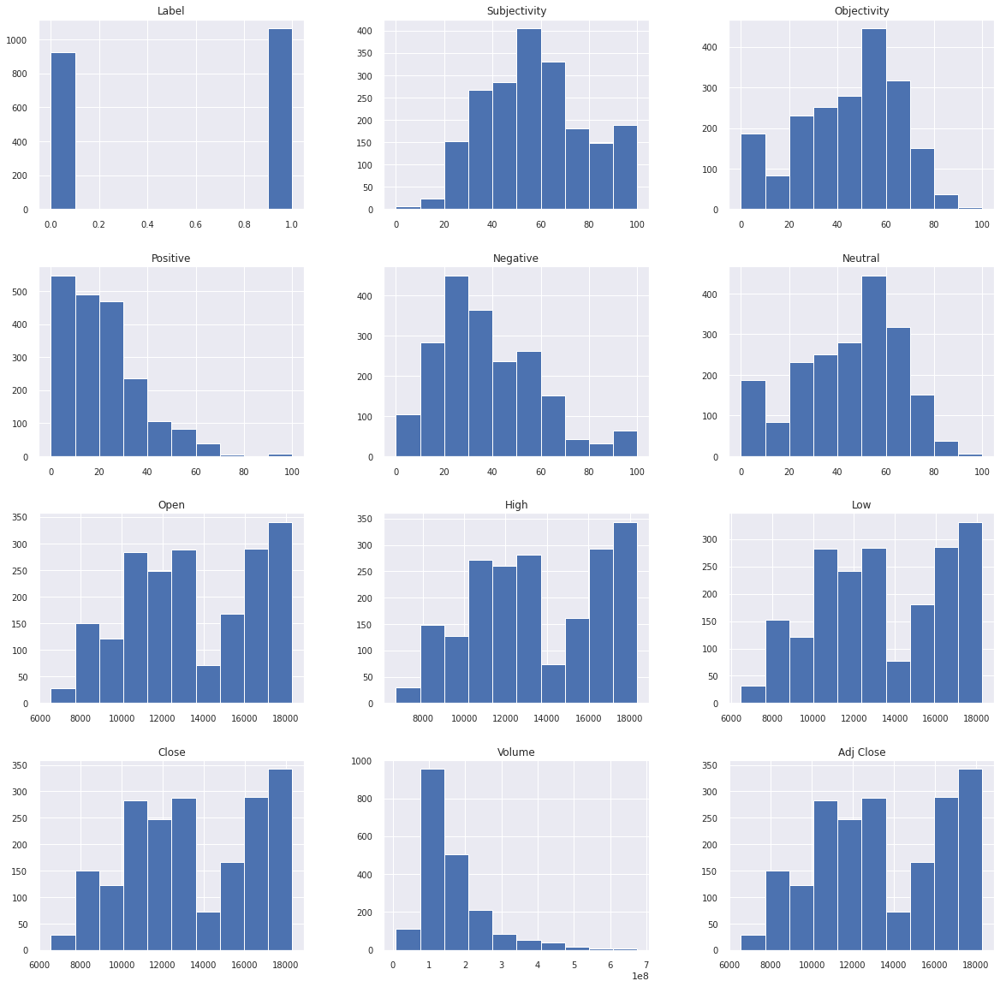

In [14]:
sns.set()
merged_dataframe.hist(sharex = False, sharey = False, xlabelsize = 10, ylabelsize = 10, figsize=(20, 20))
plt.show()

**Answer 3:**

it is obvious from graphs and describe function that means' features are far apart from each other for example "Positive" has mean 19.96 and "Volume has mean 1.62e+08 which is big difference ,so we need to do some sort of feature engineering 


**Answer 4:**

 from the graph the dataset is normally distributed as there are noe varibles is heavily right pr left skewed! which is very good



**Q4: is label balanced ?**


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



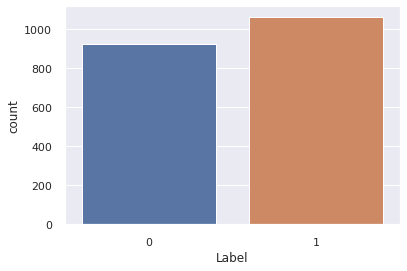

In [15]:
sns.countplot(merged_dataframe['Label'],label="Count")


**Answer4: yes almost balanced we can predict that also from the graph which has mean of 0.53	that can indicate of balance**

**Profile Report step**

In [16]:
!pip install pandas-profiling==2.7.1
!pip install pandas-profiling

In [17]:
pp.ProfileReport(merged_dataframe)

**Results from Profile Report**

**Warning Section report as following **

1.Date has high cardinality

> this will not make to us a problem as we know from our previous experience that date almost has zero correlation with the output so date column will be droped later

2.high correlation between features 


> the correlation relationship will be discussed later along with feature importance.

3.some features conatinas zeros 


> the higher percentage feature has zeros is Positive has 20.3% this percentage is not big enough to woory about it , also if we have concerns about that percentage we can replace the zeros with the means of its corresponding column as we did in the missing values part. 








      

In [29]:
merged_dataframe_copy = merged_dataframe
merged_dataframe_copy

,Date,Label,Subjectivity,Objectivity,Positive,Negative,Neutral,Open,High,Low,Close,Volume,Adj Close
1988,2008-08-08,0,75.000000,25.000000,18.750000,56.250000,25.000000,11432.089844,11759.959961,11388.040039,11734.320312,212830000.0,11734.320312
1987,2008-08-11,1,83.333333,16.666667,41.666667,41.666667,16.666667,11729.669922,11867.110352,11675.530273,11782.349609,183190000.0,11782.349609
1986,2008-08-12,0,56.250000,43.750000,18.750000,37.500000,43.750000,11781.700195,11782.349609,11601.519531,11642.469727,173590000.0,11642.469727
1985,2008-08-13,0,38.461538,61.538462,15.384615,23.076923,61.538462,11632.809570,11633.780273,11453.339844,11532.959961,182550000.0,11532.959961
1984,2008-08-14,1,45.454545,54.545455,36.363636,9.090909,54.545455,11532.070312,11718.280273,11450.889648,11615.929688,159790000.0,11615.929688
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2016-06-27,0,33.333333,66.666667,16.666667,16.666667,66.666667,17355.210938,17355.210938,17063.080078,17140.240234,138740000.0,17140.240234
3,2016-06-28,1,42.857143,57.142857,0.000000,42.857143,57.142857,17190.509766,17409.720703,17190.509766,17409.720703,112190000.0,17409.720703
2,2016-06-29,1,80.000000,20.000000,0.000000,80.000000,20.000000,17456.019531,17704.509766,17456.019531,17694.679688,106380000.0,17694.679688
1,2016-06-30,1,100.000000,0.000000,100.000000,0.000000,0.000000,17712.759766,17930.609375,17711.800781,17929.990234,133030000.0,17929.990234


**Drop Date column**

In [30]:
merged_dataframe_copy_numeric_column_only = merged_dataframe_copy.drop(columns=['Date'])
merged_dataframe_copy_numeric_column_only.head()

,Label,Subjectivity,Objectivity,Positive,Negative,Neutral,Open,High,Low,Close,Volume,Adj Close
1988,0,75.000000,25.000000,18.750000,56.250000,25.000000,11432.089844,11759.959961,11388.040039,11734.320312,212830000.0,11734.320312
1987,1,83.333333,16.666667,41.666667,41.666667,16.666667,11729.669922,11867.110352,11675.530273,11782.349609,183190000.0,11782.349609
1986,0,56.250000,43.750000,18.750000,37.500000,43.750000,11781.700195,11782.349609,11601.519531,11642.469727,173590000.0,11642.469727
1985,0,38.461538,61.538462,15.384615,23.076923,61.538462,11632.809570,11633.780273,11453.339844,11532.959961,182550000.0,11532.959961
1984,1,45.454545,54.545455,36.363636,9.090909,54.545455,11532.070312,11718.280273,11450.889648,11615.929688,159790000.0,11615.929688


**Split the dataset to x_stock and y_stock** 

In [31]:
X_stock = merged_dataframe_copy_numeric_column_only.iloc[:,1:]
y_stock = merged_dataframe_copy_numeric_column_only.iloc[:, 0]



In [32]:
X_stock.head()

,Subjectivity,Objectivity,Positive,Negative,Neutral,Open,High,Low,Close,Volume,Adj Close
1988,75.000000,25.000000,18.750000,56.250000,25.000000,11432.089844,11759.959961,11388.040039,11734.320312,212830000.0,11734.320312
1987,83.333333,16.666667,41.666667,41.666667,16.666667,11729.669922,11867.110352,11675.530273,11782.349609,183190000.0,11782.349609
1986,56.250000,43.750000,18.750000,37.500000,43.750000,11781.700195,11782.349609,11601.519531,11642.469727,173590000.0,11642.469727
1985,38.461538,61.538462,15.384615,23.076923,61.538462,11632.809570,11633.780273,11453.339844,11532.959961,182550000.0,11532.959961
1984,45.454545,54.545455,36.363636,9.090909,54.545455,11532.070312,11718.280273,11450.889648,11615.929688,159790000.0,11615.929688


In [33]:
y_stock

1988    0
1987    1
1986    0
1985    0
1984    1
       ..
4       0
3       1
2       1
1       1
0       1
Name: Label, Length: 1989, dtype: int64

  decompose data in X and Y 

In [105]:
X_train_Stock, X_test_Stock, y_train_Stock, y_tes_Stock = train_test_split(X_stock, y_stock, 
                                                    test_size = 0.25,
                                                    shuffle = True, 
                                                    random_state = 100)
X_train_Stock = np.asarray(X_train_Stock)
y_train_Stock = np.asarray(y_train_Stock)

X_test_Stock = np.asarray(X_test_Stock)
y_tes_Stock = np.asarray(y_tes_Stock)

**Feature Engineering**

As we concluded above at profile report part  there is huge varying in the ranges of the features so normalization here will be helpful

In [106]:
scaler = Normalizer().fit(X_train_Stock) #the scaler is fitted to the training set
normalized_X_train_Stock = scaler.transform(X_train_Stock) #the scaler is applied to the training set
normalized_X_test_stock = scaler.transform(X_test_Stock) #the scaler is applied to the test set


In [107]:
print("X train before Normalization")
print(X_train_Stock[0:5])
print("\nX train after Normalization")
print(normalized_X_train_Stock[0:5])

X train before Normalization
[[3.75000000e+01 6.25000000e+01 1.25000000e+01 2.50000000e+01
  6.25000000e+01 1.29807500e+04 1.29975098e+04 1.29277695e+04
  1.29775703e+04 9.39000000e+07 1.29775703e+04]
 [5.71428571e+01 4.28571429e+01 0.00000000e+00 5.71428571e+01
  4.28571429e+01 1.26327598e+04 1.27846201e+04 1.26327598e+04
  1.27164600e+04 1.43500000e+08 1.27164600e+04]
 [6.25000000e+01 3.75000000e+01 5.00000000e+01 1.25000000e+01
  3.75000000e+01 1.34735303e+04 1.34788301e+04 1.33276201e+04
  1.33449697e+04 1.01120000e+08 1.33449697e+04]
 [7.14285714e+01 2.85714286e+01 0.00000000e+00 7.14285714e+01
  2.85714286e+01 1.20779199e+04 1.21651104e+04 1.20012598e+04
  1.20961602e+04 1.45100000e+07 1.20961602e+04]
 [3.57142857e+01 6.42857143e+01 2.50000000e+01 1.07142857e+01
  6.42857143e+01 8.49673047e+03 8.59051953e+03 8.47512012e+03
  8.55559961e+03 2.20050000e+08 8.55559961e+03]]

X train after Normalization
[[3.99361003e-07 6.65601672e-07 1.33120334e-07 2.66240669e-07
  6.65601672e-07 1.

**Train , test and validation**

# Training Step

# KNN our implementation

**here we used manhatan distance because the features are dissimailr such as (Volume,Open Price)**

In [40]:
def distance_manh(x_train , x_test_point):
    """ 
    Input: 
        - x_train : corresponding to the training data
        - x_test_point : corresponding to the test point
    
    Output:
        - distances : The distances between the the test point and each point in the training data.
    
    """
    distances = []
    for row in range(len(x_train)): ## Loop over the rows of X train
        current_train_point = x_train[row] # Get them point by point
        current_distance = 0 ## Initialize the distance by zero
        
        for col in range(len(current_train_point)): ## Loop over the columns of the row
            
            current_distance += abs((current_train_point[col] - x_test_point[col])) 
            ## Or current_distance = current_distance + (x_train[i] - x_test_point[i])**2
        #current_distance = (current_distance)
        
        distances.append(current_distance) ## Append the distances !
    
    # Store distances in a dataframe
    distances = pd.DataFrame(data=distances, columns=['dist'])
    return distances

In [41]:
def nearest_neighbors(distance_point , K):
    """ 
    Input: 
        - distance_point : The distances between the the test point and each point in the training data.
        - K              : The number of neighbors
    
    Output:
        - df_nearest : The nearest K neighbors between the test point and the training data
    
    """
    # Sort distances using the sort_values function
    df_nearest = distance_point.sort_values(by=['dist'], axis=0)
    
    ## Take only the first K neighbors
    df_nearest = df_nearest[:K]
    return df_nearest

**Voting here was Majority voting as our problem is binary classifaction problem not regression problem**

In [42]:
def voting(df_nearest , y_train):
    """ 
    Input: 
        - df_nearest: Dataframe contains the nearest K neighbors between the Full training dataset and the test point
        - y_train : The labels of the training dataset
    
    Output:
        - y_pred : The prediction based on Majority Voting
    
    """
    ## Use the Counter Object to get the labels with K nearest neighbors
    counter_vote  = Counter(y_train[df_nearest.index])
    
    y_pred = counter_vote.most_common()[0][0] ## Majority Voting !
    
    return y_pred

In [43]:
def KNN_from_scratch(x_train , y_train , x_test ,  K):
    
    """ 
    Input:
    - x_train: The full training dataset
    - y_train : The labels of the training dataset
    - x_test : The full test dataset
    - K : The number of neighbors
    
    Output:
    - y_pred : The prediction for the whole test set based on Majority Voting
    """
    y_pred = []
    
    ## Loop over all the test set and perform the three steps
    for x_test_point in x_test:
        distance_point   = distance_manh(x_train, x_test_point) ## Step 1
        df_nearest_point = nearest_neighbors(distance_point , K) ## step 2
        y_pred_point     = voting(df_nearest_point , y_train) ## Step 3 
        y_pred.append(y_pred_point)
    
    return y_pred

The accuracy of KNN 

In [108]:
K = 3
y_pred_stock_code = KNN_from_scratch(normalized_X_train_Stock, y_train_Stock , X_test_Stock ,K)
print(f'The accuracy of our implementation is {accuracy_score(y_tes_Stock, y_pred_stock_code)}')


The accuracy of our implementation is 0.5542168674698795


# Sklearn KNN

In [109]:
knn_stock_classifer= KNeighborsClassifier(K)
knn_stock_classifer.fit(normalized_X_train_Stock , y_train_Stock)
y_pred__sklearn_classifer_stock = knn_stock_classifer.predict(normalized_X_test_stock)


In [110]:
print(f'The accuracy of KNN sklearn classifier is {accuracy_score(y_tes_Stock, y_pred__sklearn_classifer_stock)}')

The accuracy of KNN sklearn classifier is 0.7048192771084337


 **The accuracy of sklearn classifer KNN is 0.711 which a little not bad ,better than our implementaion 0.51**

## K-fold Cross Validation

We can improve our kNN implemenation and sklearn implementaion acurracy by Performing hyper-parameters tuning using K-fold Cross Validation

In [111]:
n_splits = 4 ## Choose the number of splits
kf = KFold(n_splits= n_splits) ## Call the K fold function
accuracy_k_sk=[]

accuracy_k = [] ## Keep track of the Accuracy for each K
k_values = list(range(1,10,2)) ## Search for the best value of K 

for k in k_values: ## Loop over the K values
    accuracy_fold = 0
    accuracy_fold1=0

    for normalized_X_train_fold_idx, normalized_X_valid_fold_idx in kf.split(normalized_X_train_Stock): ## loop over the splits
        normalized_X_train_fold = normalized_X_train_Stock[normalized_X_train_fold_idx] ## fetch the values
        y_train_fold = y_train_Stock[normalized_X_train_fold_idx]

        normalized_X_test_fold = normalized_X_train_Stock[normalized_X_valid_fold_idx]
        y_valid_fold = y_train_Stock[normalized_X_valid_fold_idx]
        y_pred_fold = KNN_from_scratch(normalized_X_train_fold, y_train_fold , normalized_X_test_fold, k) ## Get the predicted y
        
        knn_stock_classifer= KNeighborsClassifier(k)
        knn_stock_classifer.fit(normalized_X_train_fold , y_train_fold)
        y_pred__sklearn_classifer_stock = knn_stock_classifer.predict(normalized_X_test_fold)
        accuracy_fold1 += accuracy_score(y_pred__sklearn_classifer_stock, y_valid_fold)


        accuracy_fold += accuracy_score(y_pred_fold, y_valid_fold) ## Accumlate the accuracy
    accuracy_fold = accuracy_fold/n_splits ## Divide by the number of splits
    accuracy_fold1=accuracy_fold1/n_splits
    accuracy_k.append(accuracy_fold) 
    accuracy_k_sk.append(accuracy_fold1)



In [113]:
print(f"The accuracy for each k value was our imp { list ( zip (accuracy_k, k_values) ) } ")
print(f"The accuracy for each k value was sklearn { list ( zip (accuracy_k_sk, k_values) ) } ")

The accuracy for each k value was our imp [(0.6740411225460521, 1), (0.6398516100204675, 3), (0.603615339156505, 5), (0.584834169333218, 7), (0.5546390786704719, 9)] 
The accuracy for each k value was sklearn [(0.7109368243535414, 1), (0.6653315892646083, 3), (0.6270918014356136, 5), (0.5995812793680994, 7), (0.5740958949522903, 9)] 


# Decision Tree

In [61]:
def entropy(class_y):
    """ 
    Input: 
        - class_y: list of class labels (0's and 1's)
    
    Output: 
        - The entropy
        
    Compute the entropy for a list of classes
    """
    
    if len(class_y) <=1: ## Handling if there is only 1 or 0 labels
        return 0
    
    total_count = np.bincount(class_y) # count
    probabilities = total_count[np.nonzero(total_count)] / len(class_y) # Find the probabilities
    if len(probabilities) <= 1 : ## Handling if the length of the probabilities is less than or equal to 1
        return 0

    return - np.sum(probabilities * np.log(probabilities)) / np.log(len(probabilities) ) ## Entropy equation

In [62]:
def information_gain(previous_y, current_y):
    """
    Inputs:
        - previous_y : the distribution of original labels (0's and 1's)
        - current_y  : the distribution of labels after splitting based on a particular
                     split attribute and split value
    
    Outputs:
        - info_gain : The information gain after partitioning
        
    Compute and return the information gain from partitioning the previous_y labels into the current_y labels.
    
    """ 
    conditional_entropy = 0 ## IG = H(Y) - CE(Y|X)
    for y in current_y:
        conditional_entropy += (entropy(y)*len(y)/len(previous_y))

    info_gain = entropy(previous_y) - conditional_entropy
    return info_gain


In [63]:
def partition_classes(X, y, split_attribute, split_val):
    """
    Inputs:
    - X               : (N,D) list containing all data attributes
    - y               : a list of labels
    - split_attribute : column index of the attribute to split on
    - split_val       : either a numerical or categorical value to divide the split_attribute
    
    Outputs:
    - X_left          : X left after partitioning
    - X_right         : X right after partitioning
    - y_left          : y left after partitioning
    - y_right         : y right after partitioning
    
    Partition the data(X) and labels(y) based on the split value    
    """
    """
    Example:
    
    X = [[3, 'aa', 10],                 y = [1,
         [1, 'bb', 22],                      1,
         [2, 'cc', 28],                      0,
         [5, 'bb', 32],                      0,
         [4, 'cc', 32]]                      1]
    
    Here, columns 0 and 2 represent numeric attributes, while column 1 is a categorical attribute.
    
    Consider the case where we call the function with split_attribute = 0 (the index of attribute) and split_val = 3 (the value of attribute).
    Then we divide X into two lists - X_left, where column 0 is <= 3 and X_right, where column 0 is > 3.
    
    X_left = [[3, 'aa', 10],                 y_left = [1,
              [1, 'bb', 22],                           1,
              [2, 'cc', 28]]                           0]
              
    X_right = [[5, 'bb', 32],                y_right = [0,
               [4, 'cc', 32]]                           1]

    Consider another case where we call the function with split_attribute = 1 and split_val = 'bb'
    Then we divide X into two lists, one where column 1 is 'bb', and the other where it is not 'bb'.
        
    X_left = [[1, 'bb', 22],                 y_left = [1,
              [5, 'bb', 32]]                           0]
              
    X_right = [[3, 'aa', 10],                y_right = [1,
               [2, 'cc', 28],                           0,
               [4, 'cc', 32]]                           1]
               
    """
    
    X = np.array(X)
    column_split = X[:,split_attribute]
    X_left=[]
    y_right = []
    X_right = []
    y_left = []
    
    counter=0 ## Counter for appending

    if isinstance(split_val,str) == False: ## Numerical attribute
        for i in column_split:
            if i <= split_val:
                X_left.append(X[counter])
                y_left.append(y[counter])
            else:
                X_right.append(X[counter])
                y_right.append(y[counter])
            counter+=1
            
    else: ## Categorical attribute
        for i in column_split:
            if i == split_val: ## == and NOT <=
                X_left.append(X[counter])
                y_left.append(y[counter])
            else:
                X_right.append(X[counter])
                y_right.append(y[counter])
            counter+=1

    return X_left, X_right, y_left, y_right 

In [64]:
def find_best_split(X, y, split_attribute):
    
    """
    Inputs:
        - X               : (N,D) list containing all data attributes
        - y               : a list array of labels
        - split_attribute : Column of X on which to split
    
    Outputs:
        - best_split_val  : optimal split value for a given attribute
        - best_info_gain  : the corresponding information gain
    
    Compute and return the optimal split value for a given attribute, along with the corresponding information gain

    """
    
    """
    
      Example:
    
        X = [[3, 'aa', 10],                 y = [1,
             [1, 'bb', 22],                      1,
             [2, 'cc', 28],                      0,
             [5, 'bb', 32],                      0,
             [4, 'cc', 32]]                      1]
    
        split_attribute = 0
        
        Starting entropy: 0.971
        
        Calculate information gain at splits:
           split_val = 1  -->  info_gain = 0.17
           split_val = 2  -->  info_gain = 0.01997
           split_val = 3  -->  info_gain = 0.01997
           split_val = 4  -->  info_gain = 0.32
           split_val = 5  -->  info_gain = 0
        
       best_split_val = 4; info_gain = .32; 
    """
    
    
    best_info_gain = 0 # Initialize the best information gain
    X = np.array(X)
    column_split = X[:,split_attribute]

    column_split = np.unique(column_split) ## Get the unique values only !
    best_split_val = column_split[0] ## Set the best split as the initial one ( in case it is the only one)

    for split_val in column_split:
        current_X_left, current_X_right, current_y_left, current_y_right = partition_classes(X, y, split_attribute, split_val) ## Call the partition classes function
        current_y = []
        current_y.append(current_y_left)
        current_y.append(current_y_right)

        current_info_gain = information_gain(y,current_y) ## Calculate the information gain
        if current_info_gain > best_info_gain: ## check if it is better than before
            best_info_gain = current_info_gain
            best_split_val = split_val

    return best_split_val, best_info_gain

In [65]:
def find_best_feature(X, y):
    """
    Inputs:
        - X              : (N,D) list containing all data attributes
        - y              : a list of labels
    
    Outputs:
        - best_feature   : Best Feature to split on
        - best_split_val : Best Split Value for this feature
        
    Compute and return the optimal attribute to split on and optimal splitting value
    """
    
    """
        
    Example:
    
        X = [[3, 'aa', 10],                 y = [1,
             [1, 'bb', 22],                      1,
             [2, 'cc', 28],                      0,
             [5, 'bb', 32],                      0,
             [4, 'cc', 32]]                      1]
    
        split_attribute = 0
        
        Starting entropy: 0.971
        
        Calculate information gain at splits:
           feature 0:  -->  info_gain = 0.32
           feature 1:  -->  info_gain = 0.17
           feature 2:  -->  info_gain = 0.4199
        
       best_split_feature: 2 best_split_val: 22
    """
    
    
    best_info_gain = 0
    best_feature = 0
    best_split_val = 0
    for feature_index in range(len(X[0])): ## Loop over the features , find the best split 
        current_best_split_val, current_best_info_gain =  find_best_split(X, y,  feature_index)
        if current_best_info_gain > best_info_gain:
            best_info_gain = current_best_info_gain
            best_feature = feature_index
            best_split_val = current_best_split_val
    return best_feature, best_split_val

In [66]:
class MyDecisionTree(object):
    def __init__(self, max_depth=None):
        """        
        Args:
        
        max_depth: maximum depth of the tree including the root node.
        """
        self.tree = {}
        self.residual_tree = {} ## For prediction
        self.max_depth = max_depth

        
    def fit(self, X, y, depth):
        """
        Args:
        X     : N*D matrix corresponding to the data points
        Y     : N*1 array corresponding to the labels of the data points
        depth : depth of node of the tree
        
        Output:
        node : A dictionary that contains this node information
        """

        # base cases
        unique_labels = np.unique(y) 
        if (len(unique_labels)==1) or (depth == max_depth): ## IF we reach the maximum depth or the unique labels = 1
            unique_labels, counts_unique_labels = np.unique(y, return_counts=True)
            index = counts_unique_labels.argmax()
            classification = unique_labels[index]    
            return classification
    
        best_feat, best_split  = find_best_feature(X, y) ## Find best feature (Step 1)
        best_split, information_gain = find_best_split(X, y, best_feat) ## Split on this feature (Step 2)
        X_left, X_right, y_left, y_right = partition_classes(X, y, best_feat, best_split) ## Partition on the best feature and split (Step 3)
        
        if isinstance(best_split,str):
            question = "{} == {}".format(best_feat, best_split) ## Represnt the sub-tree as a question and an answer
        else:
            question = "{} <= {}".format(best_feat, best_split) ## Represnt the sub-tree as a question and an answer
        node = {question: []}
        
        # find answers (recursion)
        depth+=1 
        yes_answer = self.fit(X_left,y_left, depth)  # RECURSION on the left sub tree
        no_answer = self.fit(X_right, y_right, depth) ## RECURSION on the right sub tree
        
        if yes_answer == no_answer: ## Both trees are the same
            node = yes_answer
        else:
            node[question].append(yes_answer) ## Append the questions to the answers
            node[question].append(no_answer)
        self.tree = node ## The tree is equal to the node
        return node
        
    def predict(self, record,flag=1):
        """
        Args:
        
        record: D*1, a single data point that should be classified
        
        Output:
        prediction: True if the predicted class label is 1, False otherwise      
        
        classify a sample in test data set using self.tree and return the predicted label
        """
        if flag == 1: ## First time
            self.residual_tree = self.tree
        question = list(self.residual_tree.keys())[0]
        feature, comparison, value = question.split() ## Split the question to get the feature and its value

        
        ## Check if str or int
        if comparison == "==": # String
            if record[int(feature)] == value:
                answer = self.residual_tree[question][0]  ## Left sub tree
            else:
                answer = self.residual_tree[question][1] ## Right sub-tree
        elif comparison == "<=": #Integer
            if record[int(feature)] <= float(value):
                answer = self.residual_tree[question][0] ## Right Sub-tree
            else:
                answer = self.residual_tree[question][1] ## Left sub-tree        try: ## Integer
                
        # base case
        if not isinstance(answer, dict):  ## If we have the answer
            return answer
    
        # recursion
        else:
            self.residual_tree = answer ## The residual tree is the answer !
            return self.predict(record,0) ## have flag = 0 so the residual tree is our sub-problem

In [67]:
def DecisionTreeEvalution(id3,X,y, verbose=False):

    y_predicted = []
    for record in X: 
        y_predicted.append(id3.predict(record))
    # Comparing predicted and true labels
    results = [prediction == truth for prediction, truth in zip(y_predicted, y)]
    # Accuracy
    accuracy = float(results.count(True)) / float(len(results))
    if verbose:
        print("accuracy: %.4f" % accuracy)
    return accuracy

In [68]:
X_train_stock_decision , X_test_stock_decision , y_train_stock_decision , y_test_stock_decision = train_test_split(X_stock, y_stock,test_size = 0.2 , random_state = 10)

In [69]:
X_train_stock , X_test_stock , y_train_stock , y_test_stock = X_train_stock_decision.to_numpy() , X_test_stock_decision.to_numpy() , y_train_stock_decision.to_numpy() , y_test_stock_decision.to_numpy()

In [70]:

max_depth = 7
inital_depth = 0
id3_dt = MyDecisionTree(max_depth)
# Building a tree
print("fitting the decision tree")
id3_dt.fit(X_train_stock, y_train_stock, inital_depth)

# Evaluating the decision tree
DecisionTreeEvalution(id3_dt,X_test_stock,y_test_stock, True)

fitting the decision tree
accuracy: 0.5628


0.5628140703517588

 The acurracy of decision tree of the implememnted code is 0.562 which is very low,not better than knn with k-fold cross validation

## The final tree

In [71]:
id3_dt.tree

{'5 <= 18045.710938': [{'8 <= 17985.769531': [{'5 <= 17862.140625': [{'8 <= 17828.289062': [{'5 <= 17684.919922': [{'8 <= 17635.390625': [{'5 <= 17568.980469': [1,
              0]},
            1]},
          {'8 <= 17755.800781': [0, {'5 <= 17812.630859': [1, 0]}]}]},
        1]},
      {'7 <= 17890.359375': [0, {'5 <= 17936.220703': [1, 0]}]}]},
    {'3 <= 75.0': [1, {'5 <= 18001.269531': [1, 0]}]}]},
  {'8 <= 18105.769531': [0,
    {'5 <= 18121.779297': [1, {'8 <= 18285.400391': [0, 1]}]}]}]}

# Sklearn decision tree

In [72]:
X_train_stock_decision_sklearn , X_test_stock_decision_sklearn , y_train_stock_decision_sklearn , y_test_stock_decision_sklearn = train_test_split(X_stock, y_stock,test_size = 0.2 , random_state = 10)

In [73]:
X_train_stock_decision_sklearn = pd.get_dummies(X_train_stock_decision_sklearn,drop_first=True)
X_test_stock_decision_sklearn = pd.get_dummies(X_test_stock_decision_sklearn,drop_first=True)

In [74]:
clf = tree.DecisionTreeClassifier( criterion='entropy', max_depth = max_depth)
clf.fit(X_train_stock_decision_sklearn, y_train_stock_decision_sklearn)
y_pred_stock_decision = clf.predict(X_test_stock_decision_sklearn)
print("Accuracy:",metrics.accuracy_score(y_test_stock_decision_sklearn, y_pred_stock_decision))

Accuracy: 0.5603015075376885


the accuracy of sklearn decision tree still very low 

**This accuracy for decision was too low compared with other knn 70 and this is expected as as our problem conatins only numeric values except label column** 

# Visualize the Tree 

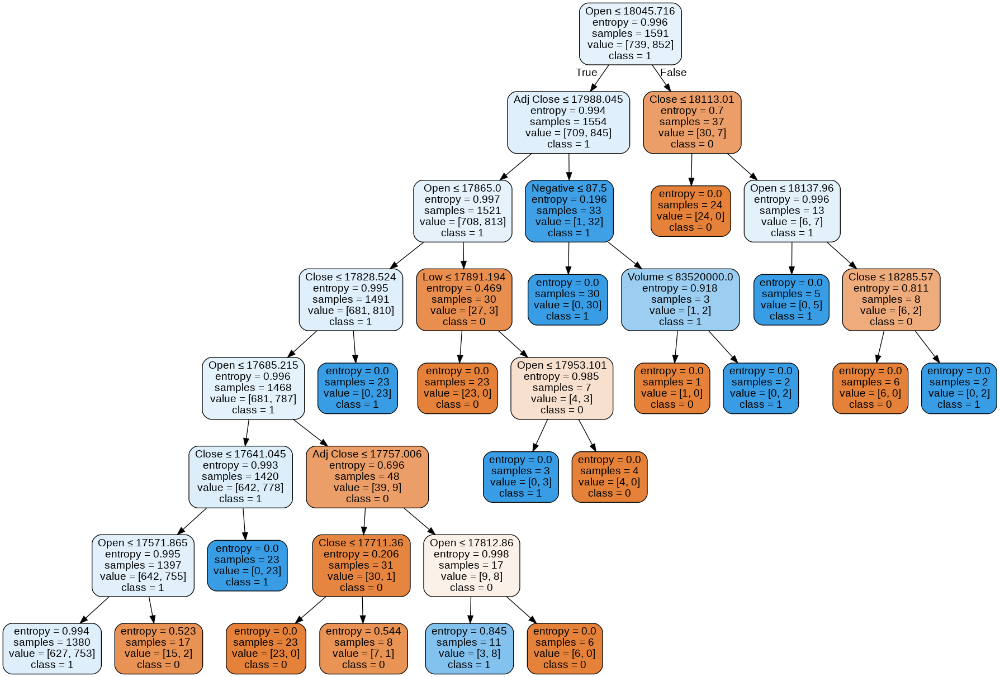

In [75]:
feature_names = list(X_train_stock_decision_sklearn.columns)

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_names,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Stock_tree.png')
Image(graph.create_png())

## Hyperparameter tuning to achieve the best accurracy

In [76]:
clf = tree.DecisionTreeClassifier( criterion='entropy', max_depth = max_depth)

print("Start fitting the data")

hp = {"criterion":['gini','entropy'], 'max_depth':np.arange(3,9)}
for cv in tqdm(range(3,6)):
    grid = GridSearchCV(clf, param_grid  = hp  , cv = cv)
    grid.fit(X_train_stock_decision_sklearn,y_train_stock_decision_sklearn)
    print(f"score for {cv} fold CV is : {grid.score(X_test_stock_decision_sklearn,y_test_stock_decision_sklearn)}")
    print(f"Best result {grid.best_params_}")

Start fitting the data


score for 3 fold CV is : 0.5603015075376885
Best result {'criterion': 'entropy', 'max_depth': 8}
score for 4 fold CV is : 0.5879396984924623
Best result {'criterion': 'gini', 'max_depth': 8}
score for 5 fold CV is : 0.585427135678392
Best result {'criterion': 'gini', 'max_depth': 7}



Best accurracy was obtained from decision tree is 0.58 with 5fold CV whic is still lower than knn.

# Features importance

1 feature Open 0.4292000246471655
2 feature Close 0.33347983096001954
3 feature Adj Close 0.1659099718599515
4 feature Low 0.037559327849038836
5 feature Negative 0.019426222364910397
6 feature Volume 0.014424622318914192
7 feature High 0.0
8 feature Neutral 0.0
9 feature Positive 0.0
10 feature Objectivity 0.0
11 feature Subjectivity 0.0


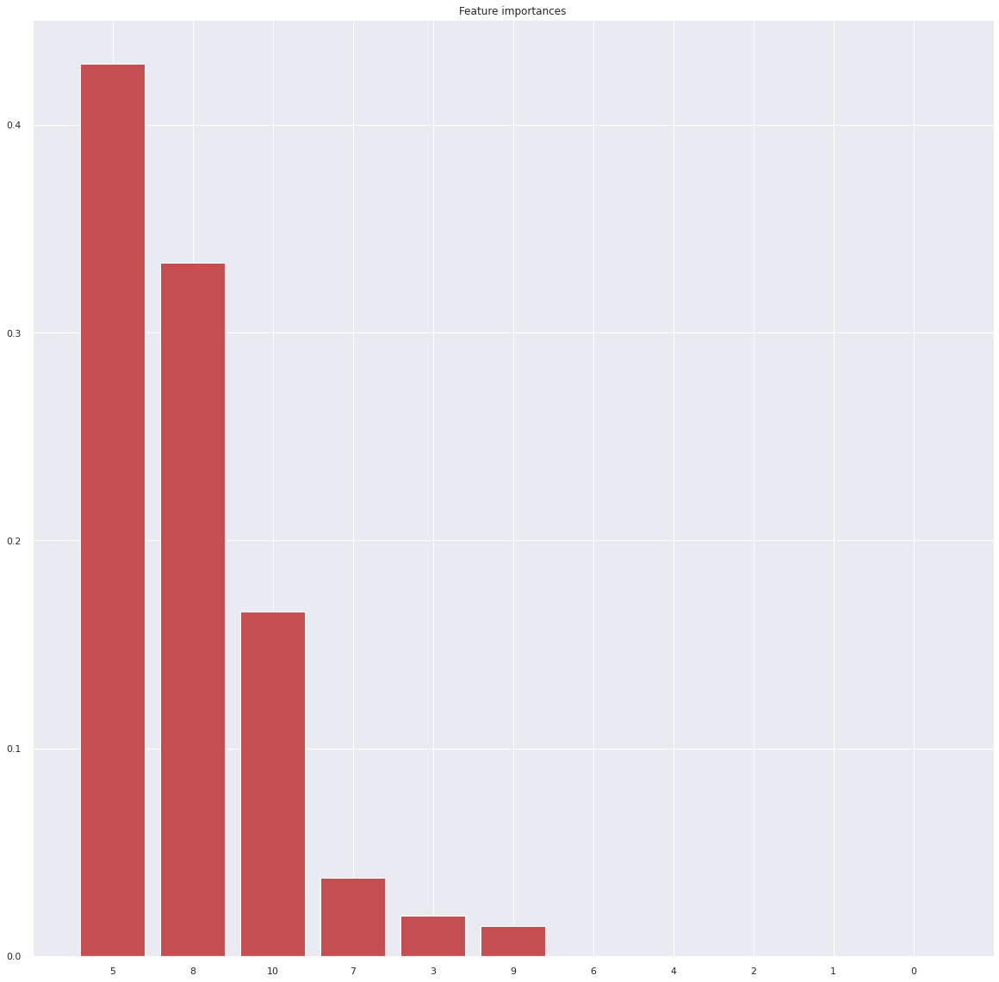

In [78]:
feature_names = list(X_train_stock_decision_sklearn.columns)
clf.fit(X_train_stock_decision_sklearn,y_train_stock_decision_sklearn)
importances = clf.feature_importances_ ## most important line in this cell

indices = np.argsort(importances)[::-1]
for f in range(X_train_stock_decision_sklearn.shape[1]):
    print(f'{f+1} feature {feature_names[indices[f]]} {importances[indices[f]]}')


plt.figure(figsize=(20, 20))
plt.title("Feature importances")
plt.bar(range(X_train_stock_decision_sklearn.shape[1]), importances[indices],
        color="r", align="center")
plt.xticks(range(X_train_stock_decision_sklearn.shape[1]), indices)
plt.xlim([-1, X_train_stock_decision_sklearn.shape[1]])
plt.show()

The most importance 5 features which are :-
- Open
- Adj
- Close
- Low 
- Negative

**Let's train on the most important 5 feature**

In [79]:
MostfiveimportantFeature_Stock= merged_dataframe.drop(columns=['Subjectivity','Objectivity','Positive','Neutral','High','Volume','Date'])
MostfiveimportantFeature_Stock.head()

,Label,Negative,Open,Low,Close,Adj Close
1988,0,56.250000,11432.089844,11388.040039,11734.320312,11734.320312
1987,1,41.666667,11729.669922,11675.530273,11782.349609,11782.349609
1986,0,37.500000,11781.700195,11601.519531,11642.469727,11642.469727
1985,0,23.076923,11632.809570,11453.339844,11532.959961,11532.959961
1984,1,9.090909,11532.070312,11450.889648,11615.929688,11615.929688


Train and test data of most important feature dataset

In [80]:
X_stock_mostimportant = MostfiveimportantFeature_Stock.iloc[:,1:]
y_stock_mostimportant = MostfiveimportantFeature_Stock.iloc[:, 0]



In [81]:
X_stock_mostimportant.head()

,Negative,Open,Low,Close,Adj Close
1988,56.250000,11432.089844,11388.040039,11734.320312,11734.320312
1987,41.666667,11729.669922,11675.530273,11782.349609,11782.349609
1986,37.500000,11781.700195,11601.519531,11642.469727,11642.469727
1985,23.076923,11632.809570,11453.339844,11532.959961,11532.959961
1984,9.090909,11532.070312,11450.889648,11615.929688,11615.929688


In [82]:
print(y_stock_mostimportant)

1988    0
1987    1
1986    0
1985    0
1984    1
       ..
4       0
3       1
2       1
1       1
0       1
Name: Label, Length: 1989, dtype: int64


In [102]:
X_train_stock_decision_sklearn_mostimp , X_test_stock_decision_sklearn_mostimp , y_train_stock_decision_sklearn_mostimp , y_test_stock_decision_sklearn_mostimp = train_test_split(X_stock_mostimportant, y_stock_mostimportant,test_size = 0.25 , random_state = 100)

In [103]:
X_train_stock_decision_sklearn_mostimp = pd.get_dummies(X_train_stock_decision_sklearn_mostimp,drop_first=True)
X_test_stock_decision_sklearn_mostimp = pd.get_dummies(X_test_stock_decision_sklearn_mostimp,drop_first=True)

In [104]:
clffmost = tree.DecisionTreeClassifier( criterion='entropy', max_depth = max_depth)
clffmost.fit(X_train_stock_decision_sklearn_mostimp, y_train_stock_decision_sklearn_mostimp)
y_predstockmostt = clffmost.predict(X_test_stock_decision_sklearn_mostimp)
print("Accuracy:",metrics.accuracy_score(y_test_stock_decision_sklearn_mostimp, y_predstockmostt))

Accuracy: 0.5803212851405622


**The accurracy was obtained from decision tree of the most important feature is 0.560 , it still very low accurracy !!**

**,,, we conclude decision tree(with all its varience) was very bad model for our problem as it was expected**

# Sklearn Random Forest

In [100]:
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_stock, y_stock, 
                                                    test_size = 0.25,
                                                    shuffle = True, 
                                                    random_state = 100)

In [101]:
X_train = pd.get_dummies(X_train_rf,drop_first=True)
X_test = pd.get_dummies(X_test_rf,drop_first=True)
clf = RandomForestClassifier(max_depth=5, n_estimators = 10 , criterion = 'entropy', oob_score = True)
clf.fit(X_train_rf, y_train_rf)
y_pred = clf.predict(X_test_rf)
print("Accuracy:",metrics.accuracy_score(y_test_rf, y_pred))

Accuracy: 0.608433734939759


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_forest.py:523: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_forest.py:528: RuntimeWarning:

invalid value encountered in true_divide



#Training a logistic regression model

In [114]:
X_train_logistic , X_test_logistic , y_train_logistic , y_test_logistic  = train_test_split(X_stock, y_stock, test_size = 0.3, random_state = 101)

In [117]:
logmodel = LogisticRegression(max_iter= 150)
logmodel.fit(X_train_logistic,y_train_logistic)
predictions_logisitc = logmodel.predict(X_test_logistic)
accuracy_score(y_test_logistic, predictions_logisitc)

0.5527638190954773

**Feature Selection: Recursive Feature Elimination**

In [119]:

model = LogisticRegression(max_iter= 150)
rfe = RFE(estimator= model, n_features_to_select=2)
rfe = rfe.fit(X_train_logistic, y_train_logistic)
selected_features= list(X_train_logistic.columns[rfe.support_])
# summarize the selection of the attributes
print(selected_features)

['Volume', 'Adj Close']


In [120]:
X_featured_selection = X_stock[selected_features]

X_train_featured_Selection, X_test_featured_Selection, y_train_featured_Selection, y_test_featured_Selection = train_test_split(X_featured_selection, y_stock, test_size = 0.3, random_state = 101)

logmodel = LogisticRegression()
logmodel.fit(X_train_featured_Selection,y_train_featured_Selection)
predictions_featured_Selection = logmodel.predict(X_test_featured_Selection)
accuracy_score(y_test_featured_Selection, predictions_featured_Selection)

0.5527638190954773

The accurracy is Very low also , although we did featured selection 

# SUM UP ALL PREVIOUS MODELS

##Confusion Matrix

In [121]:
confusion_matrix(y_test_featured_Selection, predictions_featured_Selection)

array([[  0, 267],
       [  0, 330]])

In [122]:
accuracy_score(y_test_featured_Selection, predictions_featured_Selection)

0.5527638190954773

In [123]:
precision_score(y_test_featured_Selection, predictions_featured_Selection)

0.5527638190954773

In [124]:
recall_score(y_test_featured_Selection, predictions_featured_Selection)

1.0

In [125]:
f1_score(y_test_featured_Selection, predictions_featured_Selection)

0.7119741100323624

##ROC AUC Curve

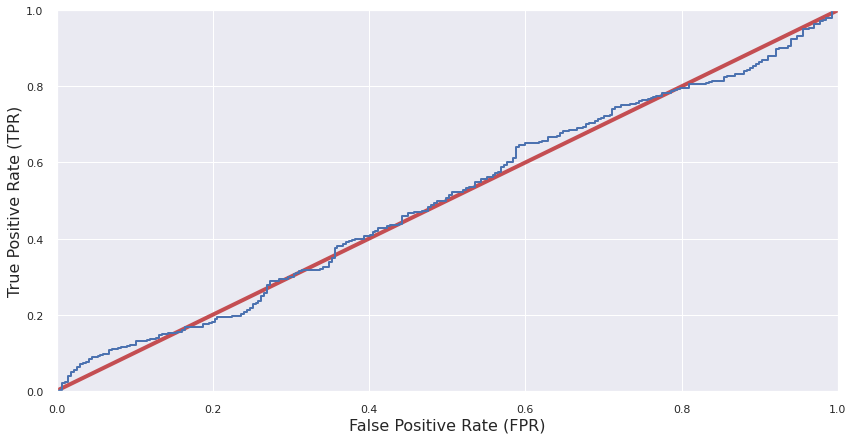

In [126]:
logreg_prob= logmodel.predict_proba(X_test_featured_Selection)[:,1]
# compute true positive rate and false positive rate
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test_featured_Selection, logreg_prob)
# plotting them against each other
def plot_roc_curve(false_positive_rate, true_positive_rate):
    plt.plot(false_positive_rate, true_positive_rate, linewidth=2)
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate (FPR)', fontsize=16)
    plt.ylabel('True Positive Rate (TPR)', fontsize=16)

plt.figure(figsize=(14, 7))
plt.plot([0, 1], [0, 1], 'r', linewidth=4)

plot_roc_curve(false_positive_rate, true_positive_rate)

In [127]:
print("Thresholds: ", thresholds)
print("True positive rate: ", true_positive_rate)
print("False positive rate: ", false_positive_rate)

Thresholds:  [1.50769884 0.50769884 0.50730079 0.50667211 0.5054643  0.50543727
 0.50543681 0.50534601 0.50518005 0.50513647 0.50492134 0.50489077
 0.50463503 0.5046332  0.50455495 0.50452084 0.50446016 0.5044435
 0.50424548 0.50422665 0.50418924 0.50413551 0.50409502 0.5040503
 0.50404391 0.50393064 0.50390155 0.5038979  0.50384657 0.5038436
 0.5038087  0.50366531 0.50361306 0.50360576 0.50357165 0.50352294
 0.50351724 0.50347127 0.50343841 0.50338252 0.50336164 0.5033224
 0.50331658 0.50330004 0.50324312 0.50316806 0.50311433 0.50306174
 0.5030598  0.50303835 0.50302957 0.50301896 0.50291025 0.50290956
 0.50288024 0.50282286 0.50278819 0.50276697 0.50275385 0.50272738
 0.50270525 0.5026619  0.50264548 0.50261468 0.50255056 0.50252992
 0.502529   0.50252148 0.5025103  0.50250881 0.50248623 0.50248029
 0.50245645 0.50242793 0.50241949 0.50239565 0.50237888 0.50237637
 0.50237614 0.50237466 0.50236371 0.50236257 0.50232606 0.50232606
 0.50231089 0.50230313 0.50229036 0.50228933 0.502276

In [128]:
r_a_score = roc_auc_score(y_test_featured_Selection, logreg_prob)
print("ROC-AUC-Score:", r_a_score)


ROC-AUC-Score: 0.5032686414708887


AUC score for logistic regression is  0.5032686414708887  and for KNN is  0.4725229826353422 and for decsion tree 0.4788219271365339


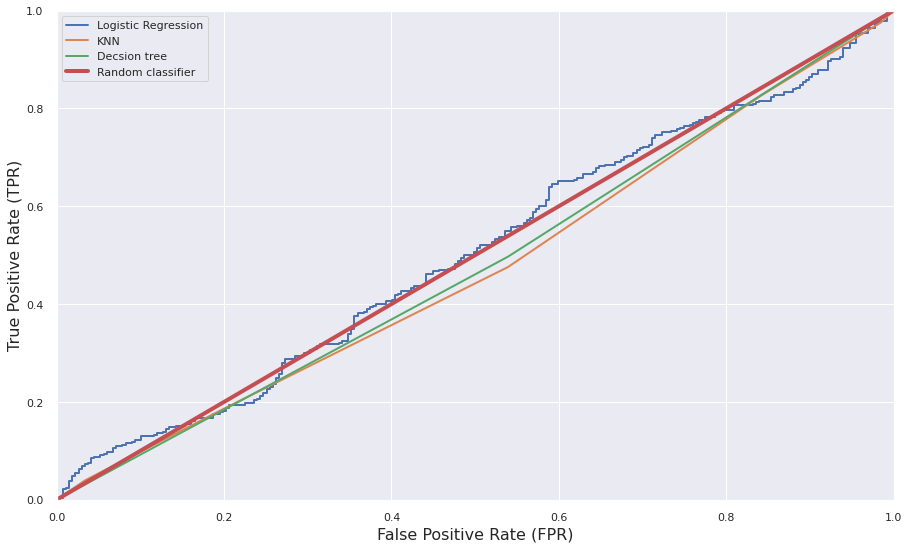

In [129]:
clf2 = KNeighborsClassifier()
clf2.fit(X_train_featured_Selection,y_train_featured_Selection)
clf3= DecisionTreeClassifier()

# Train Decision Tree Classifer
clf3.fit(X_train_featured_Selection,y_train_featured_Selection)

# compute true positive rate and false positive rate
fp1, tp1, thresholds = roc_curve(y_test_featured_Selection, logmodel.predict_proba(X_test_featured_Selection)[:,1])
fp2, tp2, thresholds = roc_curve(y_test_featured_Selection, clf2.predict_proba(X_test_featured_Selection)[:,1])
fp3, tp3, thresholds = roc_curve(y_test_featured_Selection, clf3.predict_proba(X_test_featured_Selection)[:,1])

plt.figure(figsize=(15, 9))

plot_roc_curve(fp1, tp1)
plot_roc_curve(fp2, tp2)
plot_roc_curve(fp3, tp3)
plt.plot([0, 1], [0, 1], 'r', linewidth=4)

plt.legend(['Logistic Regression', 'KNN','Decsion tree', 'Random classifier'])

auc1 = roc_auc_score(y_test_featured_Selection, logmodel.predict_proba(X_test_featured_Selection)[:,1])
auc2 = roc_auc_score(y_test_featured_Selection, clf2.predict_proba(X_test_featured_Selection)[:,1])
auc3 = roc_auc_score(y_test_featured_Selection, clf3.predict_proba(X_test_featured_Selection)[:,1])
print("AUC score for logistic regression is ", auc1, " and for KNN is ", auc2,"and for decsion tree",auc3)

AUC score for logistic regression is  0.50  and for KNN is  0.472 and for decsion tree 0.467


**from all previous models best accuracy was 70 knn sklearn** 

In [155]:
X_train_Boost, X_test_Boost, y_train_Boost, y_test_Boost = train_test_split(X_stock, y_stock, test_size = 0.2, random_state = 10)

In [154]:

rf = RandomForestRegressor(random_state = 42)

# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [156]:
grid_search.fit(X_train_Boost, y_train_Boost)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 12.5min finished


{'bootstrap': True,
 'max_depth': 80,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 300}

In [157]:
print(f"score for 3 fold CV is : {grid_search.score(X_test_Boost,y_test_Boost)}")
print(f"Best result {grid_search.best_params_}")

score for 3 fold CV is : 0.18771806146774206
Best result {'bootstrap': True, 'max_depth': 80, 'max_features': 3, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 300}


In [182]:

X_train_Boost, X_test_Boost, y_train_Boost, y_test_Boost = train_test_split(X_stock, y_stock, test_size = 0.2 ,random_state = 10)
model = AdaBoostRegressor(n_estimators=600)
model.fit(X_train_Boost, y_train_Boost)
predictedd_y = model.predict(X_test_Boost)
print(metrics.r2_score(y_test_Boost, predictedd_y))

0.0053262614975424505


In [183]:

bonusmodel = GradientBoostingRegressor(n_estimators=1900)
bonusmodel.fit(X_train_Boost, y_train_Boost)
predictedd_y_bonus = bonusmodel.predict(X_test_Boost)



In [184]:
print(metrics.r2_score(y_test_Boost, predictedd_y_bonus))

0.3748233007249052


In [204]:


pca = PCA(n_components=3)
pca.fit(X_stock)
transformed = pca.transform(X_stock)

transformed.shape
print(type(transformed))

<class 'numpy.ndarray'>


In [205]:
pca_df = pd.DataFrame(transformed)

X_train_pca, X_test_pca, y_train, y_test = train_test_split(pca_df, y_stock, test_size = 0.2 ,random_state = 10)


clf = XGBClassifier(n_estimators=500, max_depth=3)
clf.fit(X_train_pca, y_train)
y_pred_pca = clf.predict(X_test_pca)
score = accuracy_score(y_test, y_pred_pca)
print("Score is "+ str(score))

Score is 0.9422110552763819


AUC score is 0.9922852429894683
roc auc is :0.9922852429894683


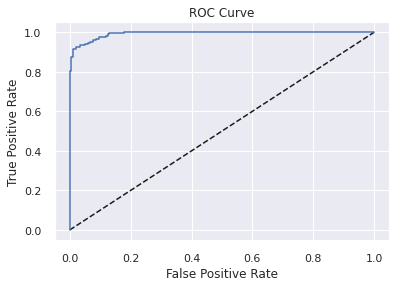

In [210]:
# Generating the ROC curve
y_pred_proba_pca = clf.predict_proba(X_test_pca)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_pca)
roc_auc = auc(fpr, tpr)
print("AUC score is " + str(roc_auc))

# Plot ROC curve
print("roc auc is :" + str(roc_auc))
pyplot.plot([0, 1], [0, 1], 'k--')
pyplot.plot(fpr, tpr)
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.title('ROC Curve')
pyplot.show()

In [214]:
pca_matrix = confusion_matrix(y_test, y_pred_pca)
pca_report = classification_report(y_test, y_pred_pca)
print("Confusion Matrix: \n" + str(pca_matrix))
print("Classification report: \n" + str(pca_report))


Confusion Matrix: 
[[171  14]
 [  9 204]]
Classification report: 
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       185
           1       0.94      0.96      0.95       213

    accuracy                           0.94       398
   macro avg       0.94      0.94      0.94       398
weighted avg       0.94      0.94      0.94       398



**XGboost with PCA transformation has got incredible accurracy 94% and this accurracy make investors more confdenital in our model to predict falling or raising of the index.**